# Alignment between murine and human MCs

In [1]:
import scanpy as sc
import seaborn as sns
import pandas as pd
import matplotlib.pyplot as plt
import numpy as np
import scvelo as scv
import scanpy.external as sce
import anndata as ad

PROJECT_DIR = "/home/sisaev/projects/Gustafsson_et_al_2022"
DATA_DIR = "/home/sisaev/data/thymus_Karin/count"
exec(open(f"{PROJECT_DIR}/tools/tools.py").read())

sc.settings.verbosity = 3
sns.set(font_scale=1)
sc.settings.set_figure_params(dpi=150)
sns.set_style("white")

Reds = get_beautiful_cmap()

## Our cross-species integration

In [2]:
homology = pd.read_csv(f"{PROJECT_DIR}/data/homology/mouse_to_human.tsv", sep="\t")
homology = homology[homology["Human homology type"] == "ortholog_one2one"]
homology = dict(zip(homology["Gene name"], homology["Human gene name"]))

adata_human = sc.read_h5ad(f"{PROJECT_DIR}/data/Human_MC_conos.h5ad")
adata_human.obs["species"] = "human"
adata_human.obs["cell_type_integrated"] = adata_human.obs["cell_type_l2"]

adata_mouse = sc.read_h5ad(f"{PROJECT_DIR}/data/Mouse_MC_conos.h5ad")
adata_mouse.obs["species"] = "mouse"
adata_mouse.var["mouse_gene_symbol"] = list(adata_mouse.var.index)
adata_mouse = adata_mouse[:, np.isin(adata_mouse.var_names, list(homology.keys()))]
adata_mouse.var.index = [homology[gene] for gene in adata_mouse.var.index]
adata_mouse.var.index = adata_mouse.var.index.astype(str)
del adata_mouse.obs["batch"]
adata_mouse.var_names_make_unique()

Variable names are not unique. To make them unique, call `.var_names_make_unique`.
Variable names are not unique. To make them unique, call `.var_names_make_unique`.


In [4]:
celltype_dict = {
    "Cd248+ MC" : "CD248+ MC",
    "Penk+ Cdh11+ MC" : "CDH11+ MC",
    "Postn+ MC" : "POSTN+ MC"
}

paper_cmap = {
    "CDH11+ MC" : "#00b3f4",
    "CD248+ MC" : "#008af6",
    "POSTN+ MC" : "#ed00ff",
    "Cycling MC" : "#00573e"
}

adata_mouse.obs["cell_type_integrated"] = [celltype_dict[ct] for ct in adata_mouse.obs["cell_type_l2"]]
adata_mouse.obs["cell_type_integrated"] = adata_mouse.obs["cell_type_integrated"].astype("category")
adata_mouse.uns["cell_type_integrated_colors"] = [
    paper_cmap[ct] for ct in adata_mouse.obs["cell_type_integrated"].cat.categories
]

In [9]:
adata_1 = ad.AnnData(
    X=adata_human.layers["counts"].copy(),
    obs=adata_human.obs[["sample_id", "cell_type_integrated", "species"]].copy(),
    var=pd.DataFrame(index=adata_human.var.index)
)
adata_1.var_names_make_unique()
adata_2 = ad.AnnData(
    X=adata_mouse.layers["counts"].copy(),
    obs=adata_mouse.obs[["sample_id", "cell_type_integrated", "species"]].copy(),
    var=pd.DataFrame(index=adata_mouse.var.index)
)

adata = adata_1.concatenate(adata_2)
del adata_1, adata_2, adata.obs["batch"]
adata.obs.index = [barcode[:-2] for barcode in adata.obs.index]
adata.layers["counts"] = adata.X.copy()

In [11]:
adata_PCA = run_conos_pagoda2(
    adata,
    batch_key="sample_id",
    tmp_dir=f"{PROJECT_DIR}/data/HumanMouse_our_MC_conos/",
    script_path=f"{PROJECT_DIR}/tools/conos_wrapper.R",
    space="PCA",
    n_hvg=1000,
    n_comps=10
)

adata_PCA.uns["cell_type_integrated_colors"] = [
    paper_cmap[ct] for ct in adata_PCA.obs["cell_type_integrated"].cat.categories
]
adata_PCA.layers["z-score"] = adata_PCA.X.copy()
sc.pp.scale(adata_PCA, layer="z-score")

... storing 'sample_id' as categorical


(1/3) Writing .h5ad-file
(2/3) Running wrapper (it may takes a long time)
(3/3) Reading conos outputs


... storing 'sample_id' as categorical
... storing 'species' as categorical
... as `zero_center=True`, sparse input is densified and may lead to large memory consumption


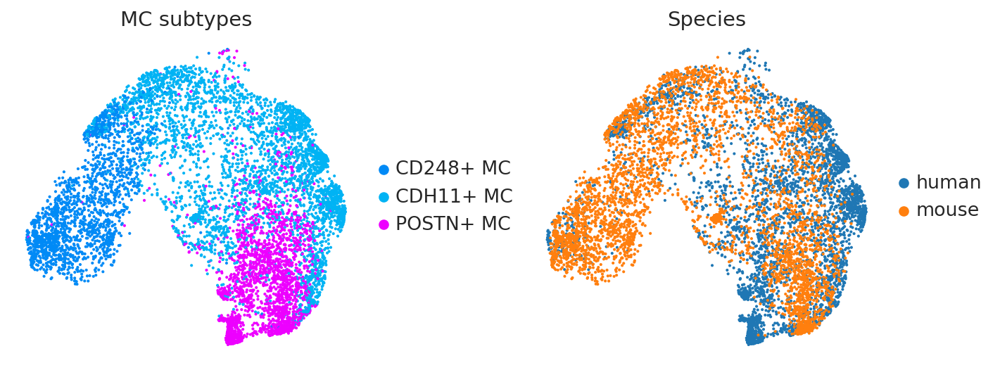

In [15]:
control_samples = ["SCG_65", "SCG_MTH2_C", "SCG_MTH3_C", "SCG_MTH4_C", "SCG_HTS1_20190722_F",
                   "SCG_HTS1_20200302_M", "SCG_HTS1_20200309_F"]
sc.pl.umap(
    adata_PCA[np.isin(adata_PCA.obs.sample_id, control_samples)],
    color=["cell_type_integrated", "species"],
    wspace=0.35,
    frameon=False,
    title=["MC subtypes", "Species"]
)

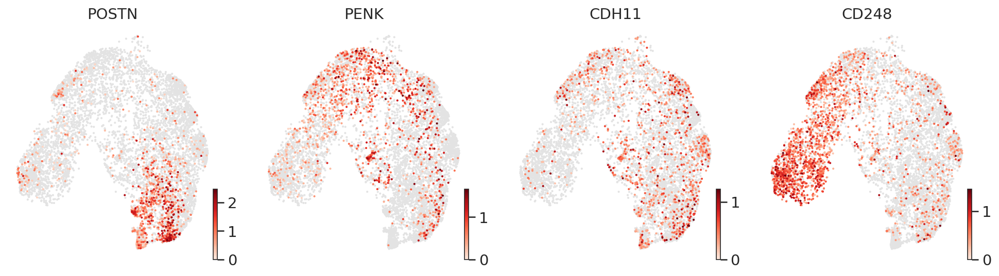

In [16]:
scv.pl.umap(
    adata_PCA[np.isin(adata_PCA.obs.sample_id, control_samples)],
    color=["POSTN", "PENK", "CDH11", "CD248"],
    cmap=Reds
)

In [17]:
adata_PCA.write_h5ad(f"{PROJECT_DIR}/data/MouseHuman_our_conos.h5ad")

## Our human integration with Park data

In [3]:
adata_Park_counts = sc.read_h5ad(f"{PROJECT_DIR}/data/Human_Park/HTA07.A01.v02.entire_data_raw_count.h5ad")
adata_Park = sc.read_h5ad(f"{PROJECT_DIR}/data/Human_Park/HTA08.v01.A05.Science_human_fig1.h5ad")

adata_Park = adata_Park[np.isin(adata_Park.obs["Anno_level_fig1"], ["Fb_1", "Fb_2", "Fb_cycling"])]
adata_Park.X = adata_Park_counts[adata_Park.obs.index].X.copy()
del adata_Park_counts

adata_Park.layers["counts"] = adata_Park.X.copy()
adata_Park.var_names_make_unique()

adata_Park.obs["sample_id"] = adata_Park.obs["Sample"]
del adata_Park.obs["Sample"]


# Selecting of only good samples with n_cells > 200
good_samples = []
n_cells = 200

Variable names are not unique. To make them unique, call `.var_names_make_unique`.
Variable names are not unique. To make them unique, call `.var_names_make_unique`.
Variable names are not unique. To make them unique, call `.var_names_make_unique`.
Variable names are not unique. To make them unique, call `.var_names_make_unique`.


In [22]:
for sample in set(adata_Park.obs.sample_id):
    if sum(adata_Park.obs.sample_id == sample) >= n_cells:
        good_samples.append(sample)
adata_Park = adata_Park[np.isin(adata_Park.obs.sample_id, good_samples)]

adata_Park.write_h5ad(f"{PROJECT_DIR}/data/Human_Park/MC.h5ad")

In [2]:
adata_human = sc.read_h5ad(f"{PROJECT_DIR}/data/Human_MC_conos.h5ad")
adata_human.obs["species"] = "human"
adata_Park = sc.read_h5ad(f"{PROJECT_DIR}/data/Human_Park/MC.h5ad")
adata_Park.obs["species"] = "human"

adata_human = adata_human.concatenate(adata_Park)
adata_human.obs.index = [barcode[:-2] for barcode in adata_human.obs.index]
del adata_human.obs["batch"]
del adata_Park

In [3]:
adata_human = run_conos_pagoda2(
    adata_human,
    n_hvg=1000,
    n_comps=15,
    layer="counts",
    batch_key="sample_id",
    script_path=f"{PROJECT_DIR}/tools/conos_wrapper.R",
    tmp_dir=f"{PROJECT_DIR}/data/Human_Park/Human_MC_conos/", 
)

... storing 'sample_id' as categorical


(1/3) Writing .h5ad-file
(2/3) Running wrapper (it may takes a long time)
(3/3) Reading conos outputs


... storing 'sample_id' as categorical
... storing 'predicted_doublet' as categorical
... storing 'leiden' as categorical
... storing 'cell_type' as categorical
... storing 'cell_type_l2' as categorical
... storing 'cell_type_l3' as categorical
... storing 'species' as categorical
... storing 'Anno_level_1' as categorical
... storing 'Anno_level_2' as categorical
... storing 'Anno_level_3' as categorical
... storing 'Anno_level_4' as categorical
... storing 'Anno_level_5' as categorical
... storing 'Anno_level_fig1' as categorical
... storing 'donor' as categorical
... storing 'organ' as categorical
... storing 'sort' as categorical
... storing 'method' as categorical
... storing 'file' as categorical
... storing 'Anno_stage' as categorical
... storing 'Age' as categorical
... storing 'Gender' as categorical
... storing 'Source' as categorical


running Leiden clustering
    finished: found 6 clusters and added
    'leiden', the cluster labels (adata.obs, categorical) (0:00:04)


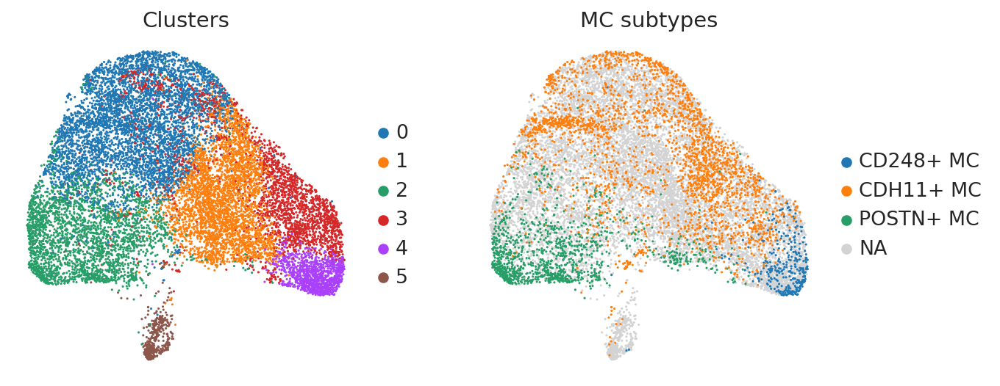

In [16]:
sc.tl.leiden(adata_human, resolution=0.8)

sc.pl.umap(
    adata_human,
    frameon=False,
    color=["leiden", "cell_type_l2"],
    title=["Clusters", "MC subtypes"]
)

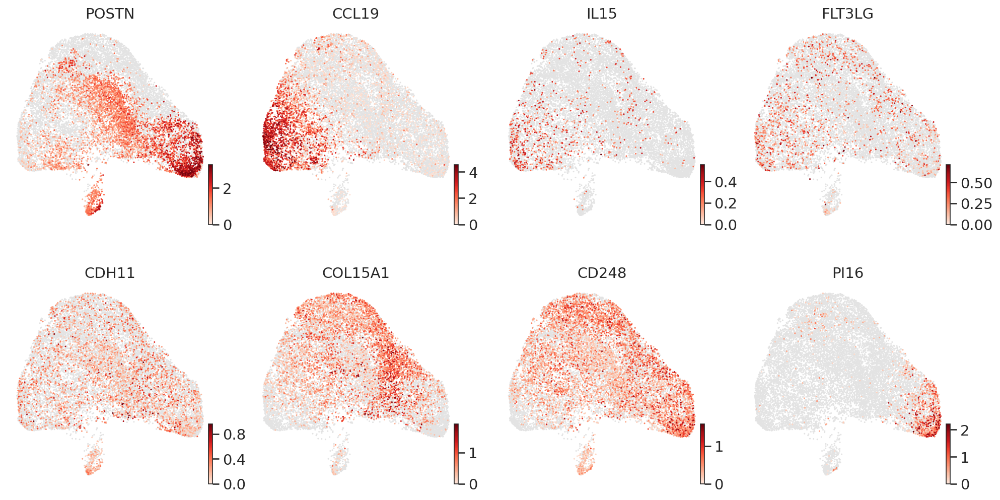

In [18]:
scv.pl.umap(
    adata_human,
    color=[
        "POSTN", "CCL19", "IL15", "FLT3LG",
        "CDH11", "COL15A1", "CD248", "PI16"
    ],
    cmap=Reds,
    ncols=4
)

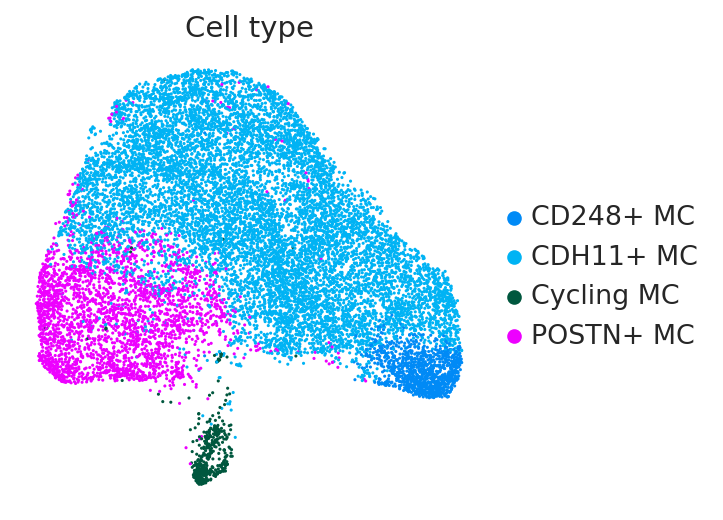

In [19]:
leiden_to_celltype = {
    "0" : "CDH11+ MC",
    "1" : "CDH11+ MC",
    "2" : "POSTN+ MC",
    "3" : "CDH11+ MC",
    "4" : "CD248+ MC",
    "5" : "Cycling MC"
}

paper_cmap = {
    "CDH11+ MC" : "#00b3f4",
    "CD248+ MC" : "#008af6",
    "POSTN+ MC" : "#ed00ff",
    "Cycling MC" : "#00573e"
}

adata_human.obs["cell_type_integrated"] = [leiden_to_celltype[leiden] for leiden in adata_human.obs.leiden]
adata_human.obs["cell_type_integrated"] = adata_human.obs["cell_type_integrated"].astype("category")
adata_human.uns["cell_type_integrated_colors"] = [
    paper_cmap[ct] for ct in adata_human.obs["cell_type_integrated"].cat.categories
]

sc.pl.umap(adata_human, color="cell_type_integrated", frameon=False, title="Cell type")

In [28]:
sc.tl.rank_genes_groups(adata_human, groupby="cell_type_integrated", method="wilcoxon")
adata_human.layers["z-score"] = adata_human.X.copy()
sc.pp.scale(adata_human, layer="z-score")

ranking genes
    finished: added to `.uns['rank_genes_groups']`
    'names', sorted np.recarray to be indexed by group ids
    'scores', sorted np.recarray to be indexed by group ids
    'logfoldchanges', sorted np.recarray to be indexed by group ids
    'pvals', sorted np.recarray to be indexed by group ids
    'pvals_adj', sorted np.recarray to be indexed by group ids (0:00:19)
... as `zero_center=True`, sparse input is densified and may lead to large memory consumption


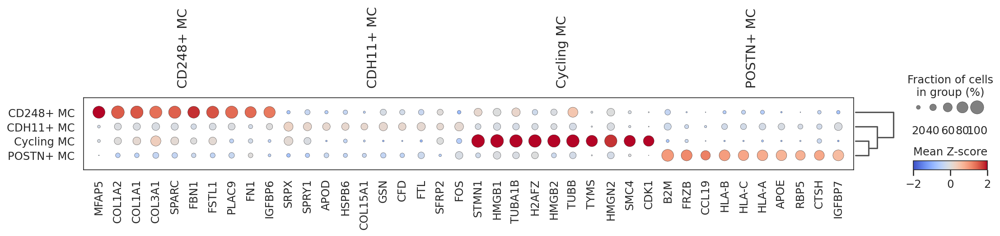

In [32]:
sc.pl.rank_genes_groups_dotplot(adata_human, n_genes=10, layer="z-score", cmap="coolwarm",
                                vmin=-2, vmax=2, colorbar_title="Mean Z-score")

In [ ]:
adata_human.write_h5ad(f"{PROJECT_DIR}/data/Human_Park/MC_conos.h5ad")

## Cross-species alignment with Park data

In [136]:
homology = pd.read_csv(f"{PROJECT_DIR}/data/homology/mouse_to_human.tsv", sep="\t")
homology = homology[homology["Human homology type"] == "ortholog_one2one"]
homology = dict(zip(homology["Gene name"], homology["Human gene name"]))

In [137]:
adata_mouse = sc.read_h5ad(f"{PROJECT_DIR}/data/Mouse_MC_conos.h5ad")
adata_human = sc.read_h5ad(f"{PROJECT_DIR}/data/Human_Park/MC_conos.h5ad")
adata_mouse.obs["species"] = "mouse"
adata_mouse.var["mouse_gene_symbol"] = list(adata_mouse.var.index)
adata_mouse = adata_mouse[:, np.isin(adata_mouse.var_names, list(homology.keys()))]
adata_mouse.var.index = [homology[gene] for gene in adata_mouse.var.index]
adata_mouse.var.index = adata_mouse.var.index.astype(str)
del adata_mouse.obs["batch"]
adata_mouse.var_names_make_unique()

Variable names are not unique. To make them unique, call `.var_names_make_unique`.
Variable names are not unique. To make them unique, call `.var_names_make_unique`.


In [138]:
celltype_dict = {
    "Cd248+ MC" : "CD248+ MC",
    "Penk+ Cdh11+ MC" : "CDH11+ MC",
    "Postn+ MC" : "POSTN+ MC"
}
adata_mouse.obs["cell_type_integrated"] = [celltype_dict[ct] for ct in adata_mouse.obs["cell_type_l2"]]
adata_mouse.obs["cell_type_integrated"] = adata_mouse.obs["cell_type_integrated"].astype("category")
adata_mouse.uns["cell_type_integrated_colors"] = [
    paper_cmap[ct] for ct in adata_mouse.obs["cell_type_integrated"].cat.categories
]

In [139]:
adata_1 = ad.AnnData(
    X=adata_human.layers["counts"].copy(),
    obs=adata_human.obs[["sample_id", "cell_type_integrated", "species"]].copy(),
    var=pd.DataFrame(index=adata_human.var.index)
)
adata_1.var_names_make_unique()
adata_2 = ad.AnnData(
    X=adata_mouse.layers["counts"].copy(),
    obs=adata_mouse.obs[["sample_id", "cell_type_integrated", "species"]].copy(),
    var=pd.DataFrame(index=adata_mouse.var.index)
)

adata = adata_1.concatenate(adata_2)
del adata_1, adata_2, adata.obs["batch"]
adata.obs.index = [barcode[:-2] for barcode in adata.obs.index]
adata.layers["counts"] = adata.X.copy()

In [140]:
adata_PCA = run_conos_pagoda2(
    adata,
    batch_key="sample_id",
    script_path=f"{PROJECT_DIR}/tools/conos_wrapper.R",
    tmp_dir=f"{PROJECT_DIR}/data/HumanMouse_MC_conos_PCA/",
    space="PCA",
    n_hvg=1000,
    n_comps=10
)
adata_PCA.uns["cell_type_integrated_colors"] = [
    paper_cmap[ct] for ct in adata_PCA.obs["cell_type_integrated"].cat.categories
]
adata_PCA.layers["z-score"] = adata_PCA.X.copy()
sc.pp.scale(adata_PCA, layer="z-score")

... storing 'sample_id' as categorical


(1/3) Writing .h5ad-file
(2/3) Running wrapper (it may takes a long time)
(3/3) Reading conos outputs


... storing 'sample_id' as categorical
... storing 'cell_type_integrated' as categorical
... storing 'species' as categorical


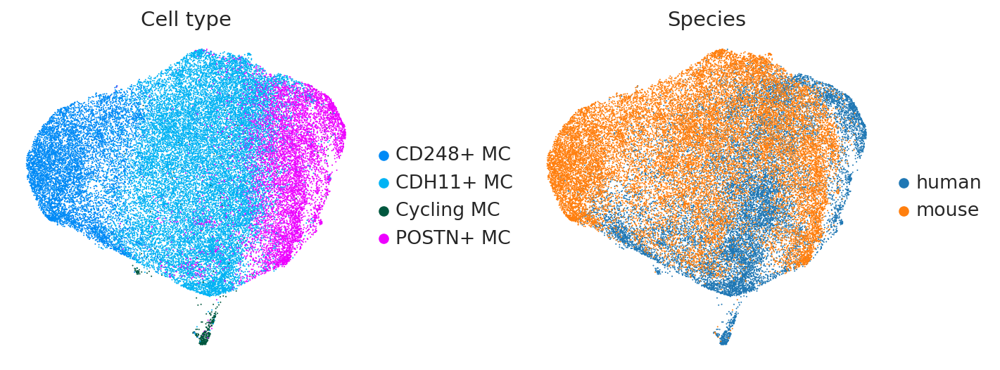

In [151]:
sc.pl.umap(
    adata_PCA,
    color=["cell_type_integrated", "species"],
    title=["Cell type", "Species"],
    frameon=False, wspace=0.35
)

In [141]:
adata_CCA = run_conos_pagoda2(
    adata,
    batch_key="sample_id",
    tmp_dir=f"{PROJECT_DIR}/data/HumanMouse_MC_conos_CCA/",
    space="CCA",
    script_path=f"{PROJECT_DIR}/tools/conos_wrapper.R",
    n_hvg=1000,
    n_comps=10
)
adata_CCA.uns["cell_type_integrated_colors"] = [
    paper_cmap[ct] for ct in adata_CCA.obs["cell_type_integrated"].cat.categories
]

... storing 'sample_id' as categorical


(1/3) Writing .h5ad-file
(2/3) Running wrapper (it may takes a long time)
(3/3) Reading conos outputs


... storing 'sample_id' as categorical
... storing 'cell_type_integrated' as categorical
... storing 'species' as categorical


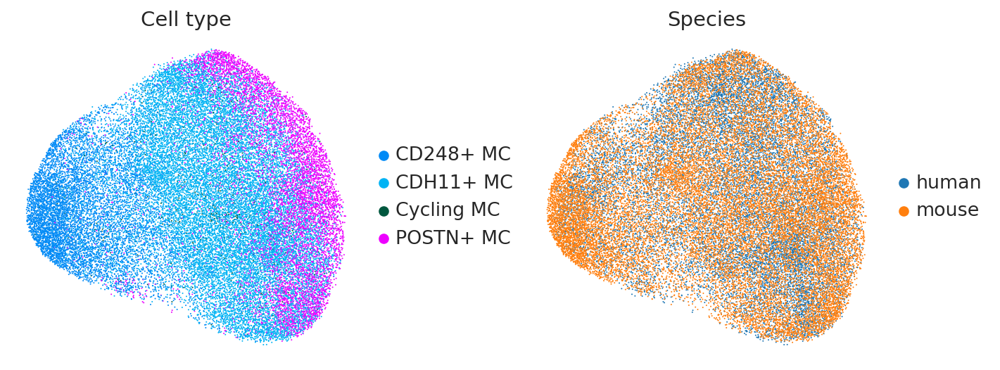

In [4]:
sc.pl.umap(
    adata_CCA,
    color=["cell_type_integrated", "species"],
    title=["Cell type", "Species"],
    frameon=False, wspace=0.35
)

In [160]:
sc.tl.rank_genes_groups(adata_human, groupby="cell_type_integrated", method="wilcoxon")
sc.tl.rank_genes_groups(adata_mouse, groupby="cell_type_integrated", method="wilcoxon")

overlapped_marker_genes = {}
n_top_genes = 150

for group in ["CD248+ MC", "CDH11+ MC", "POSTN+ MC"]:
    overlapped_marker_genes[group] = list(set(
        adata_human.uns["rank_genes_groups"]["names"][group][:n_top_genes]
    ) & set(
        adata_mouse.uns["rank_genes_groups"]["names"][group][:n_top_genes]
    ))
    
sc.pl.dotplot(adata_PCA, groupby="cell_type_integrated", var_names=overlapped_marker_genes["POSTN+ MC"],
              layer="z-score", cmap="coolwarm", vmin=-2, vmax=2, colorbar_title="Mean Z-score")

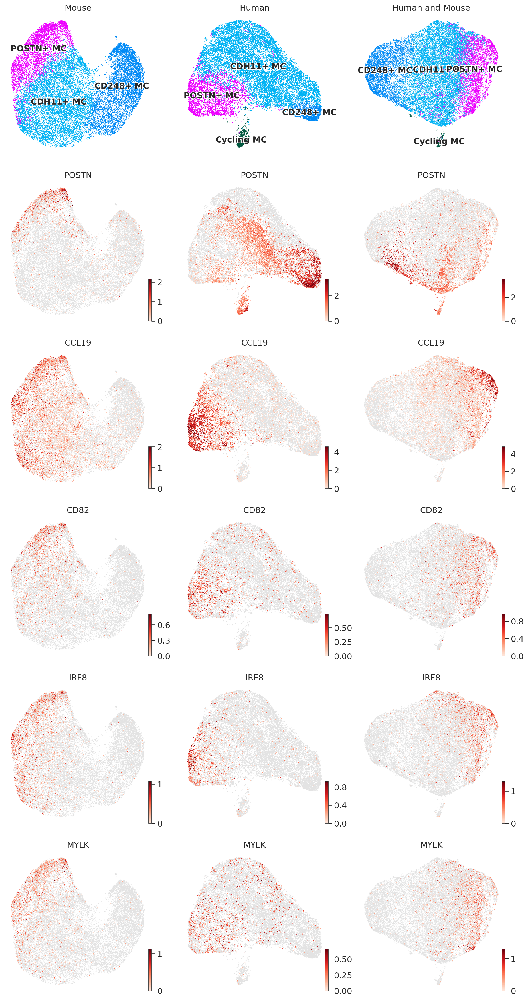

In [186]:
genes = ["POSTN", "CCL19", "CD82", "IRF8", "MYLK"]

fig, axes = plt.subplots(ncols=3, nrows=(1 + len(genes)), dpi=150, figsize=(15, 5 * (1 + len(genes))))

sc.pl.umap(adata_mouse, color="cell_type_integrated", frameon=False, legend_loc="on data",
           ax=axes[0, 0], show=False, legend_fontoutline=2, title="Mouse")
sc.pl.umap(adata_human, color="cell_type_integrated", frameon=False, legend_loc="on data",
           ax=axes[0, 1], show=False, legend_fontoutline=2, title="Human")
sc.pl.umap(adata_PCA, color="cell_type_integrated", frameon=False, legend_loc="on data",
           ax=axes[0, 2], show=False, legend_fontoutline=2, title="Human and Mouse")
counter = 1
for gene in genes:
    scv.pl.umap(adata_mouse, color=gene, ax=axes[counter, 0], cmap=Reds, show=False)
    scv.pl.umap(adata_human, color=gene, ax=axes[counter, 1], cmap=Reds, show=False)
    scv.pl.umap(adata_PCA, color=gene, ax=axes[counter, 2], cmap=Reds, show=False)
    counter += 1

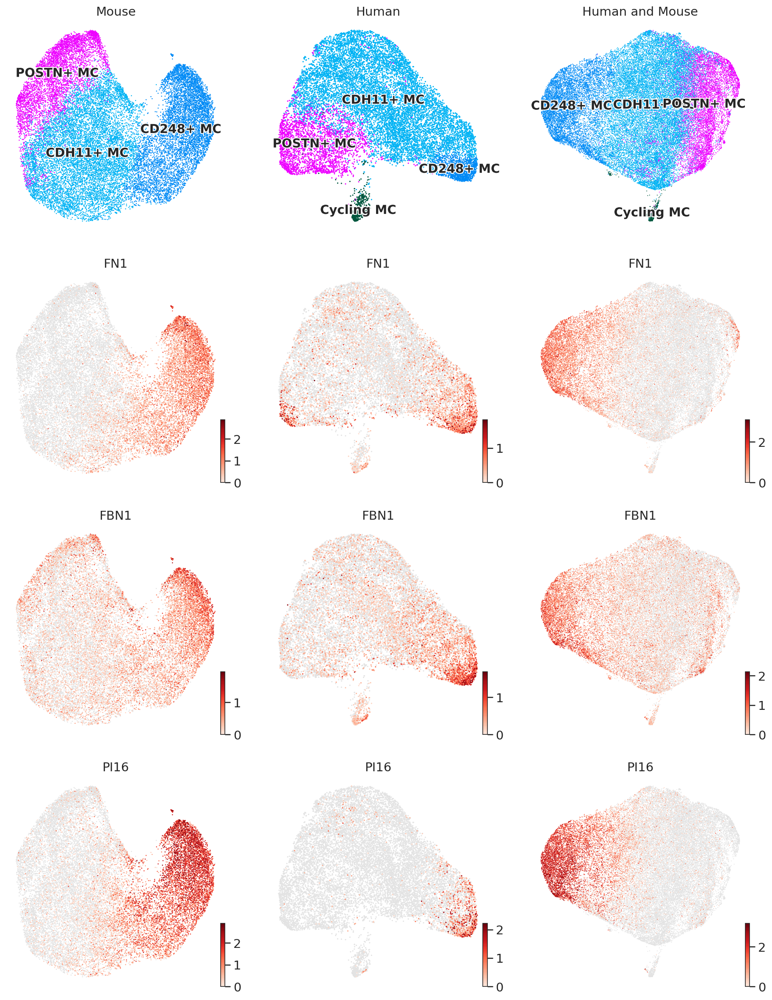

In [185]:
genes = ["FN1", "FBN1", "PI16"]

fig, axes = plt.subplots(ncols=3, nrows=(1 + len(genes)), dpi=150, figsize=(15, 5 * (1 + len(genes))))

sc.pl.umap(adata_mouse, color="cell_type_integrated", frameon=False, legend_loc="on data",
           ax=axes[0, 0], show=False, legend_fontoutline=2, title="Mouse")
sc.pl.umap(adata_human, color="cell_type_integrated", frameon=False, legend_loc="on data",
           ax=axes[0, 1], show=False, legend_fontoutline=2, title="Human")
sc.pl.umap(adata_PCA, color="cell_type_integrated", frameon=False, legend_loc="on data",
           ax=axes[0, 2], show=False, legend_fontoutline=2, title="Human and Mouse")
counter = 1
for gene in genes:
    scv.pl.umap(adata_mouse, color=gene, ax=axes[counter, 0], cmap=Reds, show=False)
    scv.pl.umap(adata_human, color=gene, ax=axes[counter, 1], cmap=Reds, show=False)
    scv.pl.umap(adata_PCA, color=gene, ax=axes[counter, 2], cmap=Reds, show=False)
    counter += 1

In [192]:
import progeny

model = progeny.load_model(organism="Human", top=1000)
progeny.run(
    adata_PCA,
    model,
    center=True,
    num_perm=100,
    norm=True,
    scale=True,
    use_raw=False,
    min_size=5
)

7508 genes found


100%|██████████| 100/100 [00:21<00:00,  4.63it/s]


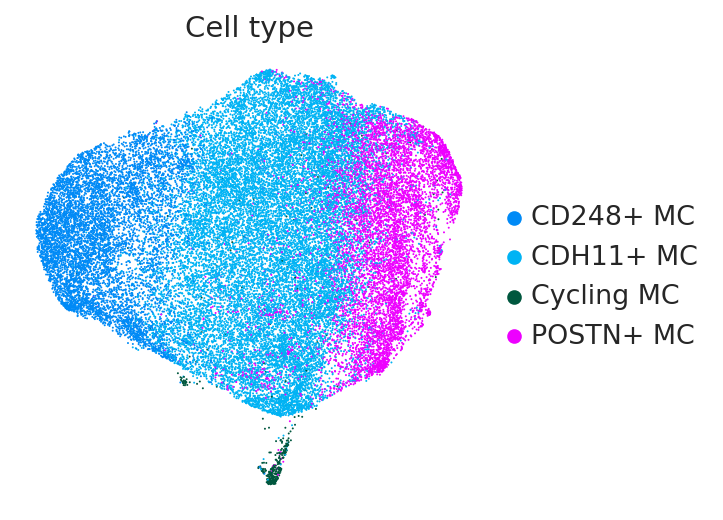

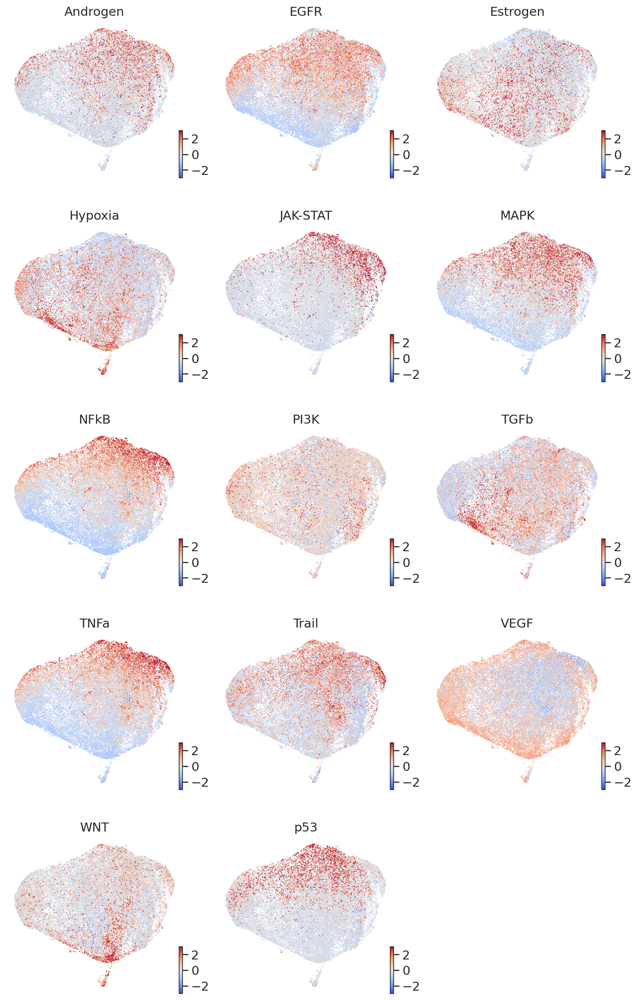

In [195]:
adata_progeny = progeny.extract(adata_PCA)
sc.pl.umap(adata_PCA, color="cell_type_integrated", title="Cell type", frameon=False)
scv.pl.umap(adata_progeny, color=adata_progeny.var.index, vmin=-3, vmax=3, cmap="coolwarm", ncols=3)